# 01. Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib

# 02. Import Data

In [2]:
# path shortcut
path = r'C:\Users\georg\Documents\2025-04-07 - NBA Game Analysis\Data'

In [3]:
# import Cleaned Games dataset
df_games = pd.read_csv(os.path.join(path, 'games_cleaned.csv'), index_col = False)

In [4]:
# import teams dataset
df_teams = pd.read_csv(os.path.join(path, 'teams.csv'), index_col = False)

# 03. Creating a Correlation Heatmap

In [5]:
df_games.columns

Index(['Unnamed: 0', 'GAME_DATE_EST', 'GAME_ID', 'GAME_STATUS_TEXT',
       'HOME_TEAM_ID', 'VISITOR_TEAM_ID', 'SEASON', 'TEAM_ID_home', 'PTS_home',
       'FG_PCT_home', 'FT_PCT_home', 'FG3_PCT_home', 'AST_home', 'REB_home',
       'TEAM_ID_away', 'PTS_away', 'FG_PCT_away', 'FT_PCT_away',
       'FG3_PCT_away', 'AST_away', 'REB_away', 'HOME_TEAM_WINS'],
      dtype='object')

### I will only show the following columns: PTS_home, FG_PCT_home, AST_home, REB_home, PTS_away, FG_PCT_away, AST_away, REB_away, HOME_TEAM_WINS

### the most important correlation to look at would be how everything correlates to HOME_TEAM_WINS 

In [6]:
# creating a subset of the data with the chosen columns
sub = df_games[['PTS_home', 'FG_PCT_home', 'AST_home', 'REB_home', 'PTS_away', 'FG_PCT_away', 'AST_away', 'REB_away', 'HOME_TEAM_WINS']]

In [7]:
sub

,PTS_home,FG_PCT_home,AST_home,REB_home,PTS_away,FG_PCT_away,AST_away,REB_away,HOME_TEAM_WINS
0,126.0,0.484,25.0,46.0,117.0,0.478,23.0,44.0,1
1,120.0,0.488,16.0,40.0,112.0,0.561,20.0,37.0,1
2,114.0,0.482,22.0,37.0,106.0,0.470,20.0,46.0,1
3,113.0,0.441,27.0,49.0,93.0,0.392,15.0,46.0,1
4,108.0,0.429,22.0,47.0,110.0,0.500,20.0,47.0,0
...,...,...,...,...,...,...,...,...,...
26547,93.0,0.419,24.0,50.0,87.0,0.366,17.0,43.0,1
26548,81.0,0.338,18.0,40.0,85.0,0.411,17.0,47.0,0
26549,98.0,0.448,29.0,45.0,95.0,0.387,19.0,43.0,1
26550,99.0,0.440,21.0,30.0,94.0,0.469,18.0,45.0,1


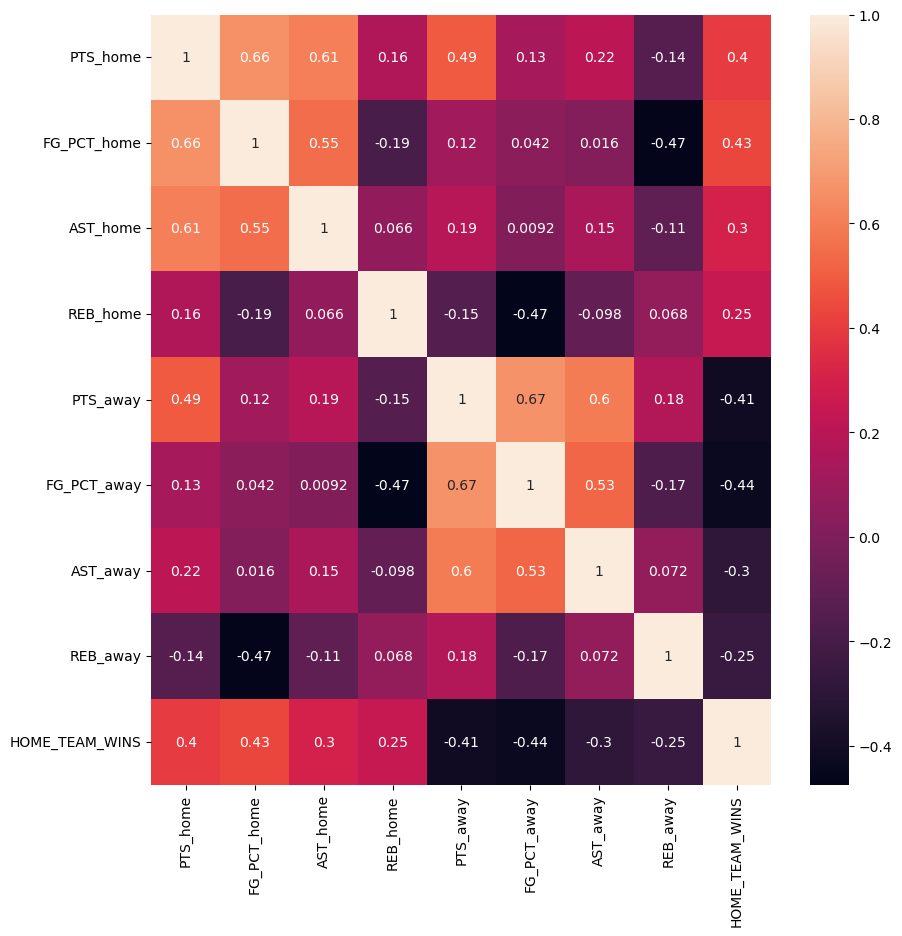

In [8]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr = sns.heatmap(sub.corr(), annot = True, ax = ax)

# save fig
f.savefig('heatmap.png', bbox_inches = 'tight', dpi = 300)

### Some things were expected. I expected a strong positive correlation between PTS_Home and both FG_PCT_home & AST_home (and the same on the away side). It makes sense that if a team scores a lot of points, it's likely because they had a good shooting percentage, and also had a lot of assists. The correlations being above 0.5 confirm the relationship.

### One thing that surprised me was the low correlation between Reb_home and pts_home (and the same on the away side). I would have expected rebounds to have a higher correlation with total points - maybe not as high as assits or FG%, but not as low as it is. 

### When it comes to home_team_wins, the strongest correlations were with pts_home and FG_pct_home, followed by assits and then rebounds, which again supports the idea that better offensive efficiency contribute more to winning. We see the same opposite correlation with home_team_wins and pts_away and fg_pct_away, which makes sense - if the away team performs well offensively the likelihood of the home team winning decreases. 

In [9]:
cwd = os.getcwd()
cwd

'C:\\Users\\georg\\Documents\\2025-04-07 - NBA Game Analysis'

# 04. Scatter Plot

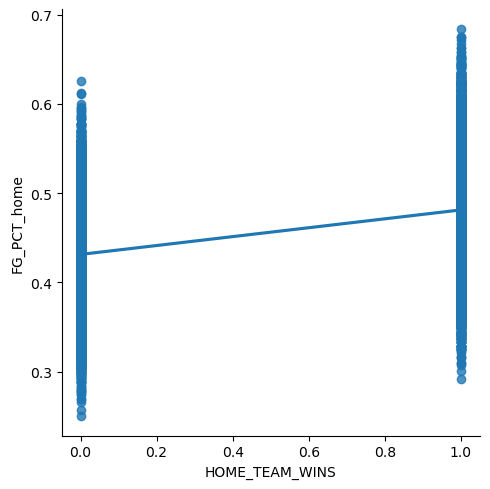

In [10]:
# Creating a scatter plot to show the relationship between home_team_wins and FG%

j = sns.lmplot(x = 'HOME_TEAM_WINS', y = 'FG_PCT_home', data = sub)

# save fig
j.savefig('scatter_team_wins.png', bbox_inches = 'tight', dpi = 300)

### the possible values for Home_team_wins are 0 & 1 so this plot doesnt really work. 
### it does show that when the home team loses, their FG% on average is lower than their FG% when they win

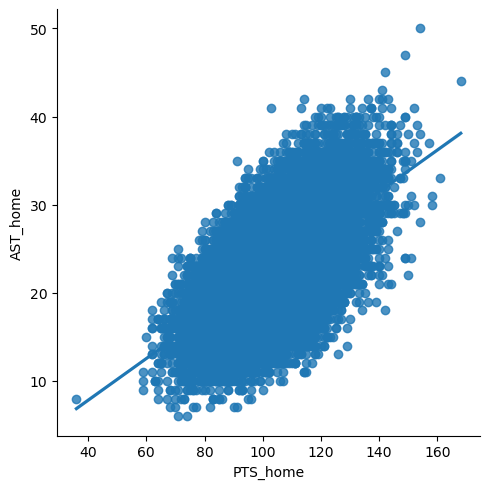

In [11]:
# creating another scatter plot to show the relationship between points and assists

l = sns.lmplot(x = 'PTS_home', y = 'AST_home', data = sub)

# save fig
l.savefig('scatter_pts_ast.png', bbox_inches = 'tight', dpi = 300)

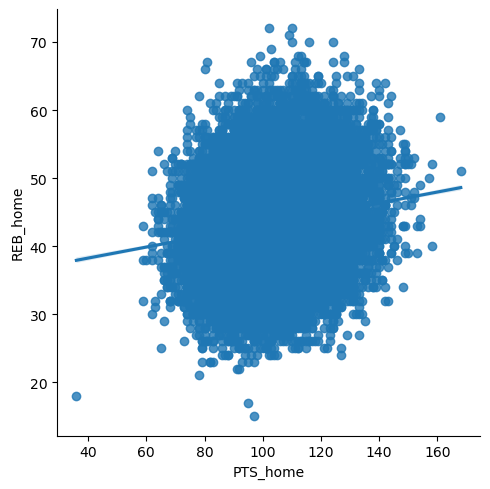

In [12]:
# creating another scatter plot to show the relationship between points and rebounds

m = sns.lmplot(x = 'PTS_home', y = 'REB_home', data = sub)

# save fig
m.savefig('scatter_pts_reb.png', bbox_inches = 'tight', dpi = 300)

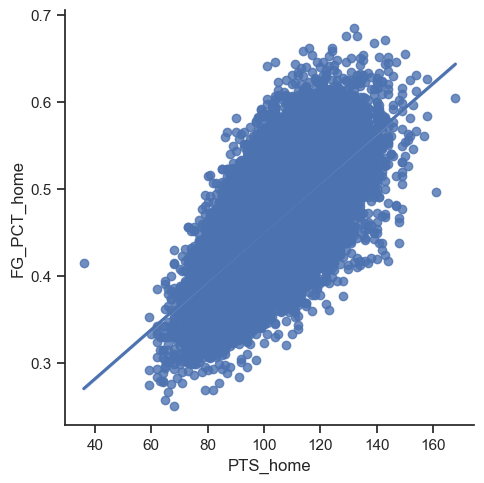

In [27]:
# creating another scatter plot to show the relationship between points and FG%

k = sns.lmplot(x = 'PTS_home', y = 'FG_PCT_home', data = sub)

# save fig
k.savefig('scatter_pts.png', bbox_inches = 'tight', dpi = 300)

### thsi shows that the higher the FG% the more points scored

# 05. Pair Plot

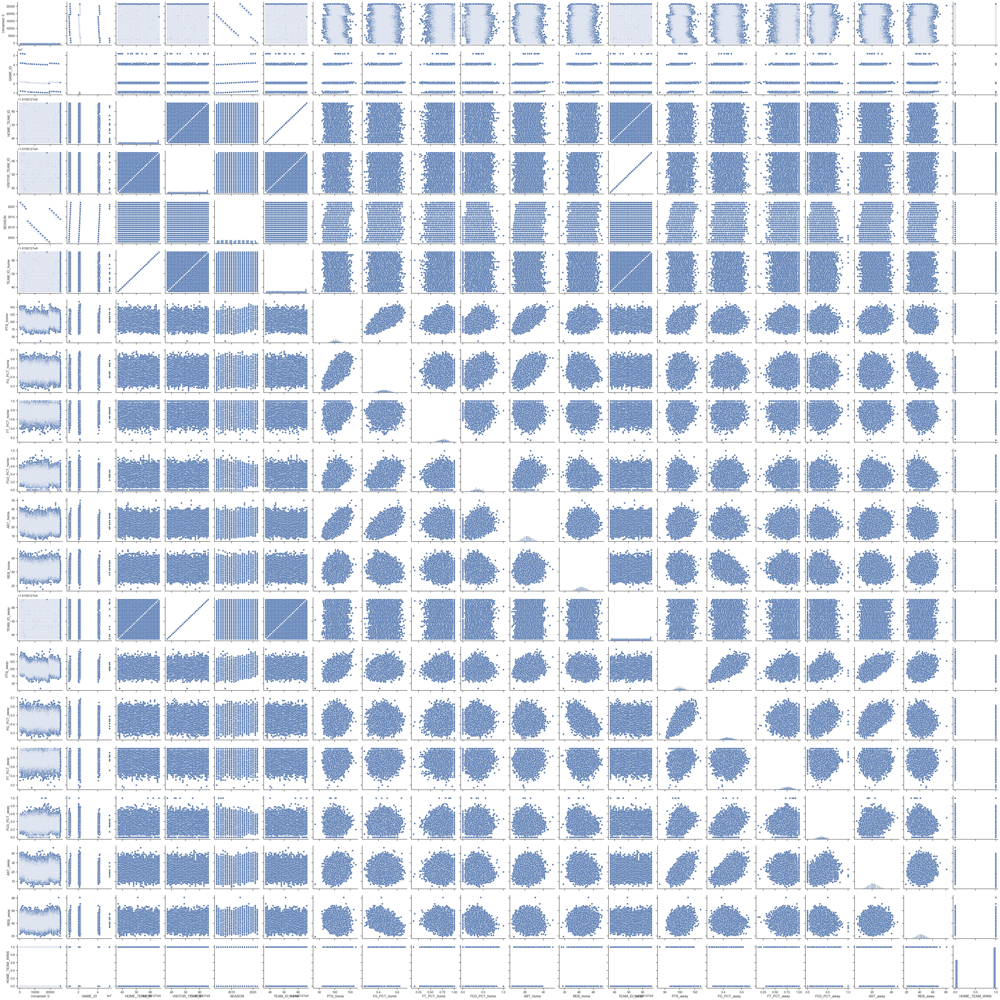

In [28]:
# creating a pair plot with the entire dataset

g = sns.pairplot(df_games)

# save fig
g.savefig('pair_plot_full.png', bbox_inches = 'tight', dpi = 300)

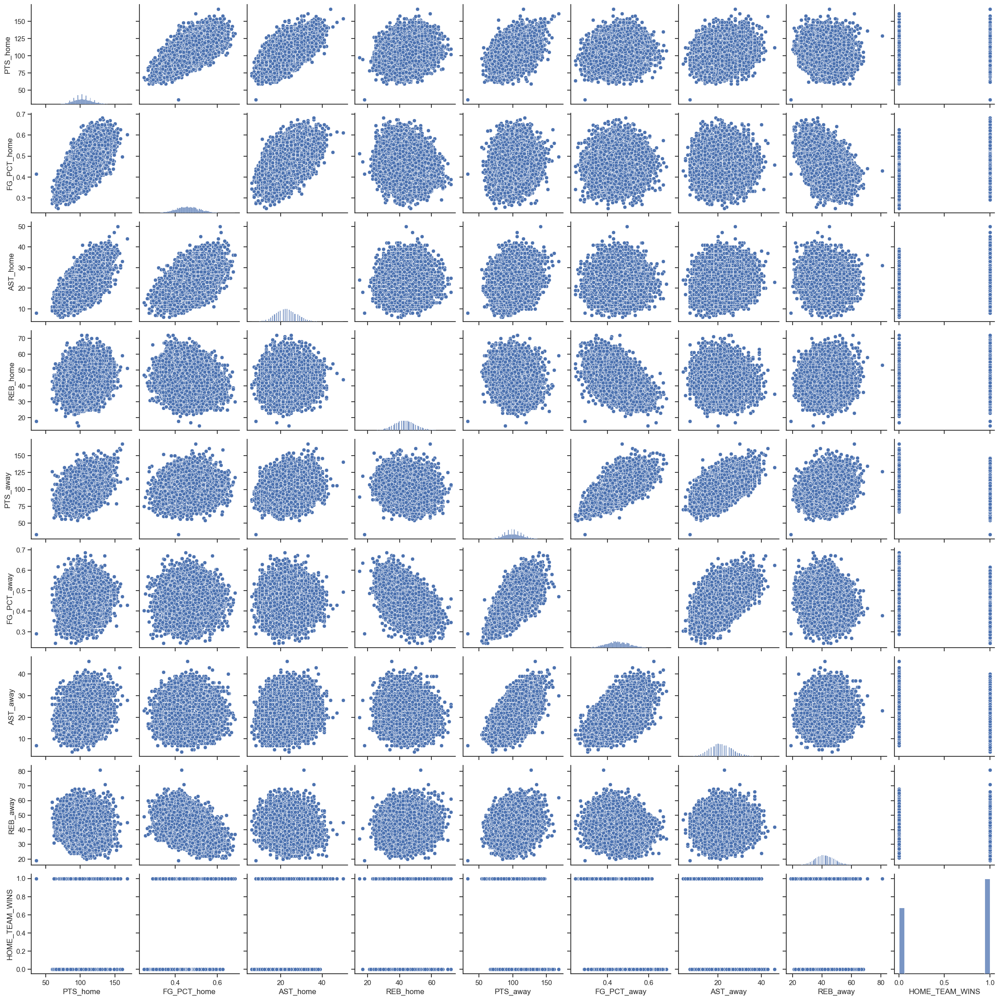

In [29]:
# creating a pair plot with the subset 

h = sns.pairplot(sub)

# save fig
h.savefig('pair_plot_sub.png', bbox_inches = 'tight', dpi = 300)

### The scatterplots allow us to visuallize teh relationships between the variables.
### We can clearly see the positive relationship between PTS_home, FG% and Assists - clear upward linear trend
### We can also see that rebounds dont really have a tight relationship with scroing - plots are very scattered. 

# 06. Categorical Plot

In [19]:
# Categorizing Pts_home into buckets

df_games.loc[df_games['PTS_home'] <= 100, 'PTS_category'] = 'Low'
df_games.loc[(df_games['PTS_home'] > 100) & (df_games['PTS_home'] <= 115), 'PTS_category'] = 'Medium'
df_games.loc[df_games['PTS_home'] > 115, 'PTS_category'] = 'High'

In [20]:
df_games['PTS_category'].value_counts(dropna = False)

PTS_category
Low       11228
Medium    10499
High       4825
Name: count, dtype: int64

<Axes: xlabel='PTS_home', ylabel='Count'>

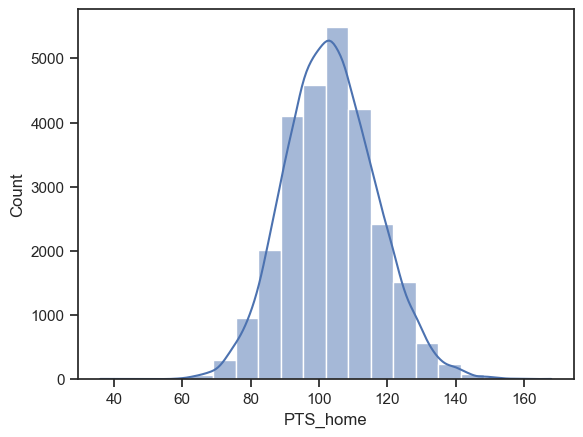

In [32]:
sns.histplot(df_games['PTS_home'], bins = 20, kde = True)

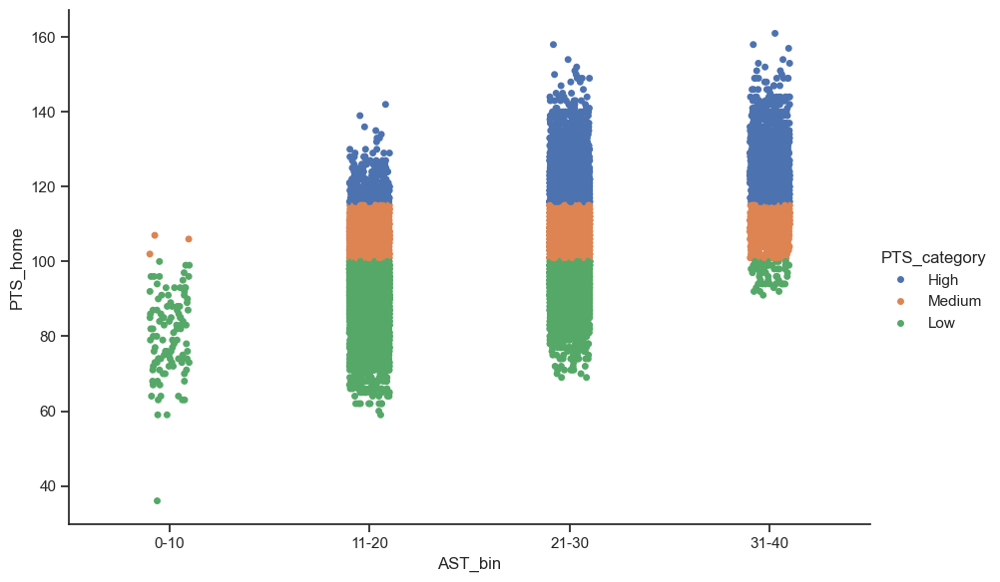

In [35]:
# creating bins for Assists
df_games['AST_bin'] = pd.cut(df_games['AST_home'], bins = [0, 10, 20, 30, 40], labels = ['0-10', '11-20', '21-30', '31-40'])

# creating a categorical plot
i = sns.catplot(x = 'AST_bin', y = 'PTS_home', hue = 'PTS_category', data = df_games, kind = 'strip', height = 6, aspect = 1.5)

# save fig
i.savefig('cat_plot.png', bbox_inches = 'tight', dpi = 300)

### This plot further shows the positive relationship between assists and points - more assists generally lead to more points. 

# 07. Other Questions

### Question 3: How do Assists & rebounds affect win/loss outcomes?
#### Both assists and rebounds show a positive correlation with wins. However, assists appear to have a stronger relationship with winning outcomes compared to rebounds. 

### other questions were not answered in this analysis. 

# 08. Hypothesis

### There is a positive correlation between FG% and total points scored 